# Welcome to Team Quebec 

# Context

# Content

# Methodology 

# Research Questions

#### 1. What are the Top 10 companies that received the highest fund?
#### 2  Which 5 sectors received the most funding?
#### 3. Who are the major investors (Top 5) in the Indian ecosystem?
#### 4. What are the Top 5 locations or headquarters with the highest funding?
#### 5. What is the average fund for start-ups in India per year?

# Hypothesis

In [1]:
# Next we set the hypothesis for the data

#### H0: The level of startup funding in India does not increase per year
#### H1: The level of startup funding in India increases per year

# Importing the Libraries 

In [2]:
# Import all the libraries needed in a single cell

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from summarytools import dfSummary
from decimal import Decimal

import warnings
warnings.filterwarnings('ignore')

# Other packages
import os
import re
#display all columns and rows 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
from sklearn.impute import SimpleImputer

# for the hypothesis

from scipy import stats
import statistics as stat

# Load the data 

In [3]:
# import and read the files

df2018= pd.read_csv("startup_funding2018.csv")
df2019= pd.read_csv("startup_funding2019.csv")
df2020= pd.read_csv("startup_funding2020.csv")
df2021= pd.read_csv("startup_funding2021.csv")

# Exploring the Data

In [4]:
#Start with the 2018 dataset
df2018

,Company Name,Industry,Round/Series,Amount,Location,About Company
0,TheCollegeFever,"Brand Marketing, Event Promotion, Marketing, S...",Seed,250000,"Bangalore, Karnataka, India","TheCollegeFever is a hub for fun, fiesta and f..."
1,Happy Cow Dairy,"Agriculture, Farming",Seed,"₹40,000,000","Mumbai, Maharashtra, India",A startup which aggregates milk from dairy far...
2,MyLoanCare,"Credit, Financial Services, Lending, Marketplace",Series A,"₹65,000,000","Gurgaon, Haryana, India",Leading Online Loans Marketplace in India
3,PayMe India,"Financial Services, FinTech",Angel,2000000,"Noida, Uttar Pradesh, India",PayMe India is an innovative FinTech organizat...
4,Eunimart,"E-Commerce Platforms, Retail, SaaS",Seed,—,"Hyderabad, Andhra Pradesh, India",Eunimart is a one stop solution for merchants ...
5,Hasura,"Cloud Infrastructure, PaaS, SaaS",Seed,1600000,"Bengaluru, Karnataka, India",Hasura is a platform that allows developers to...
6,Tripshelf,"Internet, Leisure, Marketplace",Seed,"₹16,000,000","Kalkaji, Delhi, India",Tripshelf is an online market place for holida...
7,Hyperdata.IO,Market Research,Angel,"₹50,000,000","Hyderabad, Andhra Pradesh, India",Hyperdata combines advanced machine learning w...
8,Freightwalla,"Information Services, Information Technology",Seed,—,"Mumbai, Maharashtra, India",Freightwalla is an international forwarder tha...
9,Microchip Payments,Mobile Payments,Seed,—,"Bangalore, Karnataka, India",Microchip payments is a mobile-based payment a...


In [5]:
# Then explore the 2019 data set
df2019.head()

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage
0,Bombay Shaving,NaN,NaN,Ecommerce,Provides a range of male grooming products,Shantanu Deshpande,Sixth Sense Ventures,"$6,300,000",NaN
1,Ruangguru,2014.0,Mumbai,Edtech,A learning platform that provides topic-based ...,"Adamas Belva Syah Devara, Iman Usman.",General Atlantic,"$150,000,000",Series C
2,Eduisfun,NaN,Mumbai,Edtech,It aims to make learning fun via games.,Jatin Solanki,"Deepak Parekh, Amitabh Bachchan, Piyush Pandey","$28,000,000",Fresh funding
3,HomeLane,2014.0,Chennai,Interior design,Provides interior designing solutions,"Srikanth Iyer, Rama Harinath","Evolvence India Fund (EIF), Pidilite Group, FJ...","$30,000,000",Series D
4,Nu Genes,2004.0,Telangana,AgriTech,"It is a seed company engaged in production, pr...",Narayana Reddy Punyala,Innovation in Food and Agriculture (IFA),"$6,000,000",NaN


In [6]:
# Then explore the 2020 data set
df2020.head()

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage,Unnamed: 9
0,Aqgromalin,2019,Chennai,AgriTech,Cultivating Ideas for Profit,"Prasanna Manogaran, Bharani C L",Angel investors,"$200,000",NaN,NaN
1,Krayonnz,2019,Bangalore,EdTech,An academy-guardian-scholar centric ecosystem ...,"Saurabh Dixit, Gurudutt Upadhyay",GSF Accelerator,"$100,000",Pre-seed,NaN
2,PadCare Labs,2018,Pune,Hygiene management,Converting bio-hazardous waste to harmless waste,Ajinkya Dhariya,Venture Center,Undisclosed,Pre-seed,NaN
3,NCOME,2020,New Delhi,Escrow,Escrow-as-a-service platform,Ritesh Tiwari,"Venture Catalysts, PointOne Capital","$400,000",NaN,NaN
4,Gramophone,2016,Indore,AgriTech,Gramophone is an AgTech platform enabling acce...,"Ashish Rajan Singh, Harshit Gupta, Nishant Mah...","Siana Capital Management, Info Edge","$340,000",NaN,NaN


In [7]:
# Then explore the 2021 data set
df2021.head()

,Company/Brand,Founded,HeadQuarter,Sector,What it does,Founders,Investor,Amount($),Stage
0,Unbox Robotics,2019.0,Bangalore,AI startup,Unbox Robotics builds on-demand AI-driven ware...,"Pramod Ghadge, Shahid Memon","BEENEXT, Entrepreneur First","$1,200,000",Pre-series A
1,upGrad,2015.0,Mumbai,EdTech,UpGrad is an online higher education platform.,"Mayank Kumar, Phalgun Kompalli, Ravijot Chugh,...","Unilazer Ventures, IIFL Asset Management","$120,000,000",NaN
2,Lead School,2012.0,Mumbai,EdTech,LEAD School offers technology based school tra...,"Smita Deorah, Sumeet Mehta","GSV Ventures, Westbridge Capital","$30,000,000",Series D
3,Bizongo,2015.0,Mumbai,B2B E-commerce,Bizongo is a business-to-business online marke...,"Aniket Deb, Ankit Tomar, Sachin Agrawal","CDC Group, IDG Capital","$51,000,000",Series C
4,FypMoney,2021.0,Gurugram,FinTech,"FypMoney is Digital NEO Bank for Teenagers, em...",Kapil Banwari,"Liberatha Kallat, Mukesh Yadav, Dinesh Nagpal","$2,000,000",Seed


In [8]:
# Check the number of columns and rows of the dataframe

print(df2018.shape)
print(df2019.shape)
print(df2020.shape)
print(df2021.shape)

(526, 6)
(89, 9)
(1055, 10)
(1209, 9)


# Data Cleaning

In [9]:
# We notice inconsistencies in the dataset, firstly the column names in the 2018 are different from those in 2019-2021 datasets. To correct this we;
# Rename the first file columns

df2018.rename({'Company Name': 'Company/Brand', 'Industry': 'Sector', 'About Company': 'What it does', 'Location': 'HeadQuarter', 'Amount': 'Amount($)', 'Round/Series': 'Stage'}, axis=1, inplace=True)

df2018.head()

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does
0,TheCollegeFever,"Brand Marketing, Event Promotion, Marketing, S...",Seed,250000,"Bangalore, Karnataka, India","TheCollegeFever is a hub for fun, fiesta and f..."
1,Happy Cow Dairy,"Agriculture, Farming",Seed,"₹40,000,000","Mumbai, Maharashtra, India",A startup which aggregates milk from dairy far...
2,MyLoanCare,"Credit, Financial Services, Lending, Marketplace",Series A,"₹65,000,000","Gurgaon, Haryana, India",Leading Online Loans Marketplace in India
3,PayMe India,"Financial Services, FinTech",Angel,2000000,"Noida, Uttar Pradesh, India",PayMe India is an innovative FinTech organizat...
4,Eunimart,"E-Commerce Platforms, Retail, SaaS",Seed,—,"Hyderabad, Andhra Pradesh, India",Eunimart is a one stop solution for merchants ...


In [10]:
#Next, we add a year of funding to the dataset by creating columns for 2018, 2019, 2020, and 2021 to the four datasets.

df2018['Year']=['2018']*526
df2019['Year']=['2019']*89
df2020['Year']=['2020']*1055
df2021['Year']=['2021']*1209

In [11]:
#We notice the 2018 dataset does not have an investor column, this is important for our analysis, so we add it by;

df2018['Investor']=['Undisclosed']*526

In [12]:
#We also notice the HeadQuarter names in the 2018 datasets include state and country, we remove this by;


df2018['HeadQuarter']=df2018.HeadQuarter.str.split(',').str[0]

df2018.head()

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year,Investor
0,TheCollegeFever,"Brand Marketing, Event Promotion, Marketing, S...",Seed,250000,Bangalore,"TheCollegeFever is a hub for fun, fiesta and f...",2018,Undisclosed
1,Happy Cow Dairy,"Agriculture, Farming",Seed,"₹40,000,000",Mumbai,A startup which aggregates milk from dairy far...,2018,Undisclosed
2,MyLoanCare,"Credit, Financial Services, Lending, Marketplace",Series A,"₹65,000,000",Gurgaon,Leading Online Loans Marketplace in India,2018,Undisclosed
3,PayMe India,"Financial Services, FinTech",Angel,2000000,Noida,PayMe India is an innovative FinTech organizat...,2018,Undisclosed
4,Eunimart,"E-Commerce Platforms, Retail, SaaS",Seed,—,Hyderabad,Eunimart is a one stop solution for merchants ...,2018,Undisclosed


In [13]:
#We repeat the same for the sector column in 2018 dataset because it contains multiple entries

df2018['Sector']=df2018.Sector.str.split(',').str[0]

df2018.head()

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year,Investor
0,TheCollegeFever,Brand Marketing,Seed,250000,Bangalore,"TheCollegeFever is a hub for fun, fiesta and f...",2018,Undisclosed
1,Happy Cow Dairy,Agriculture,Seed,"₹40,000,000",Mumbai,A startup which aggregates milk from dairy far...,2018,Undisclosed
2,MyLoanCare,Credit,Series A,"₹65,000,000",Gurgaon,Leading Online Loans Marketplace in India,2018,Undisclosed
3,PayMe India,Financial Services,Angel,2000000,Noida,PayMe India is an innovative FinTech organizat...,2018,Undisclosed
4,Eunimart,E-Commerce Platforms,Seed,—,Hyderabad,Eunimart is a one stop solution for merchants ...,2018,Undisclosed


# Cleaning the Sector Column

In [14]:
df2018['Sector'].replace("Credit", "Finance", inplace = True)
df2018['Sector'].replace("Banking", "Finance", inplace = True)
df2018['Sector'].replace("Financial Services", "Finance", inplace = True)
df2018['Sector'].replace("E-Commerce Platforms", "E-Commerce", inplace = True)
df2018['Sector'].replace("Internet of Things", "Internet", inplace = True)
df2018['Sector'].replace("Wellness", "Fitness", inplace = True)
df2018['Sector'].replace("Consumer Applications", "Apps", inplace = True)
df2018['Sector'].replace("Funding Platform", "Finance", inplace = True)
df2018['Sector'].replace("Consumer", "Finance", inplace = True)
df2018['Sector'].replace("Consumer Electronics", "Electronics", inplace = True)
df2018['Sector'].replace("AgTech", "Agriculture", inplace = True)
df2018['Sector'].replace("Farming", "Agriculture", inplace = True)
df2018['Sector'].replace("Crowdfunding", "Finance", inplace = True)
df2018['Sector'].replace("Biopharma", "Biotechnology", inplace = True)
df2018['Sector'].replace("Health Insurance", "Insurance", inplace = True)
df2018['Sector'].replace("Computer", "E-Commerce", inplace = True)
df2018['Sector'].replace("Autonomous Vehicles", "Automobile", inplace = True)
df2018['Sector'].replace("Accounting", "Finance", inplace = True)
df2018['Sector'].replace("Electric Vehicle", "Automobile", inplace = True)
df2018['Sector'].replace("Consumer", "Consumer Goods", inplace = True)
df2018['Sector'].replace("Last Mile Transportation", "Transportation", inplace = True)
df2018['Sector'].replace("Reading Apps", "Apps", inplace = True)
df2018['Sector'].replace("Health Diagnostics", "Fitness", inplace = True)
df2018['Sector'].replace("Continuing Education", "Education", inplace = True)
df2018['Sector'].replace("Food Processing", "Food", inplace = True)
df2018['Sector'].replace("Cooking", "Food", inplace = True)
df2018['Sector'].replace("Crowdsourcing", "Finance", inplace = True)
df2018['Sector'].replace("Classifieds", "E-Commerce", inplace = True)
df2018['Sector'].replace("AgTech", "Agriculture", inplace = True)
df2018['Sector'].replace("Creative Agency", "Finance", inplace = True)
df2018['Sector'].replace("Catering", "Food", inplace = True)
df2018['Sector'].replace("Cloud Infrastructure", "Cloud Computing", inplace = True)
df2018['Sector'].replace("Clean Energy", "CleanTech", inplace = True)
df2018['Sector'].replace("Air Transportation", "Aerospace", inplace = True)
df2018['Sector'].replace("Food Delivery", "Delivery", inplace = True)
df2018['Sector'].replace("Enterprise Software", "Software", inplace = True)
df2018['Sector'].replace("Renewable Energy", "Energy", inplace = True)
df2018['Sector'].replace("Marketplace", "B2B", inplace = True)
df2018['Sector'].replace("Consumer Lending", "Finance", inplace = True)
df2018['Sector'].replace("Digital Entertainment", "Media and Entertainment", inplace = True)
df2018['Sector'].replace("Enterprise Resource Planning (ERP)", "Real Estate", inplace = True)
df2018['Sector'].replace("Digital Media", "Media and Entertainment", inplace = True)
df2018['Sector'].replace("Commercial Real Estate", "Real Estate", inplace = True)
df2018['Sector'].replace("Medical Device", "Health", inplace = True)
df2018['Sector'].replace("Alternative Medicine", "Health", inplace = True)
df2018['Sector'].replace("Commercial", "E-Commerce", inplace = True)
df2018['Sector'].replace("Medical", "Health", inplace = True)
df2018['Sector'].replace("Communities", "Consultancy", inplace = True)
df2018['Sector'].replace("FinTech", "Finance", inplace = True)
df2018['Sector'].replace("Food and Beverage", "Food", inplace = True)
df2018['Sector'].replace("Fantasy Sports", "Sports", inplace = True)
df2018['Sector'].replace("E-Learning", "EdTech", inplace = True)
df2018['Sector'].replace("eSports", "Sports", inplace = True)
df2018['Sector'].replace("Health Care", "Health", inplace = True)
df2018['Sector'].replace("Automotive", "Automobile", inplace = True)

In [15]:
# Check the data type of the files

df2018.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 526 entries, 0 to 525
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Company/Brand  526 non-null    object
 1   Sector         526 non-null    object
 2   Stage          526 non-null    object
 3   Amount($)      526 non-null    object
 4   HeadQuarter    526 non-null    object
 5   What it does   526 non-null    object
 6   Year           526 non-null    object
 7   Investor       526 non-null    object
dtypes: object(8)
memory usage: 33.0+ KB


In [16]:
# We now delete unnecessary columns

df2019.drop(axis=1, columns=({"Founders", "Founded"}), inplace=True)
df2020.drop(axis=1, columns=({"Founders", "Founded","Unnamed: 9"}), inplace=True)
df2021.drop(axis=1, columns=({"Founders", "Founded"}), inplace=True)

In [17]:
# Merge the 4 data sets together

whole_data=pd.concat([df2018, df2019, df2020, df2021], ignore_index=True)

whole_data

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,What it does,Year,Investor
0,TheCollegeFever,Brand Marketing,Seed,250000,Bangalore,"TheCollegeFever is a hub for fun, fiesta and f...",2018,Undisclosed
1,Happy Cow Dairy,Agriculture,Seed,"₹40,000,000",Mumbai,A startup which aggregates milk from dairy far...,2018,Undisclosed
2,MyLoanCare,Finance,Series A,"₹65,000,000",Gurgaon,Leading Online Loans Marketplace in India,2018,Undisclosed
3,PayMe India,Finance,Angel,2000000,Noida,PayMe India is an innovative FinTech organizat...,2018,Undisclosed
4,Eunimart,E-Commerce,Seed,—,Hyderabad,Eunimart is a one stop solution for merchants ...,2018,Undisclosed
5,Hasura,Cloud Computing,Seed,1600000,Bengaluru,Hasura is a platform that allows developers to...,2018,Undisclosed
6,Tripshelf,Internet,Seed,"₹16,000,000",Kalkaji,Tripshelf is an online market place for holida...,2018,Undisclosed
7,Hyperdata.IO,Market Research,Angel,"₹50,000,000",Hyderabad,Hyperdata combines advanced machine learning w...,2018,Undisclosed
8,Freightwalla,Information Services,Seed,—,Mumbai,Freightwalla is an international forwarder tha...,2018,Undisclosed
9,Microchip Payments,Mobile Payments,Seed,—,Bangalore,Microchip payments is a mobile-based payment a...,2018,Undisclosed


In [18]:
whole_data.drop(axis=1, columns=("What it does"), inplace=True)

whole_data

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,Year,Investor
0,TheCollegeFever,Brand Marketing,Seed,250000,Bangalore,2018,Undisclosed
1,Happy Cow Dairy,Agriculture,Seed,"₹40,000,000",Mumbai,2018,Undisclosed
2,MyLoanCare,Finance,Series A,"₹65,000,000",Gurgaon,2018,Undisclosed
3,PayMe India,Finance,Angel,2000000,Noida,2018,Undisclosed
4,Eunimart,E-Commerce,Seed,—,Hyderabad,2018,Undisclosed
5,Hasura,Cloud Computing,Seed,1600000,Bengaluru,2018,Undisclosed
6,Tripshelf,Internet,Seed,"₹16,000,000",Kalkaji,2018,Undisclosed
7,Hyperdata.IO,Market Research,Angel,"₹50,000,000",Hyderabad,2018,Undisclosed
8,Freightwalla,Information Services,Seed,—,Mumbai,2018,Undisclosed
9,Microchip Payments,Mobile Payments,Seed,—,Bangalore,2018,Undisclosed


In [19]:
# align the columns in a specific format

whole_data[['Year', 'Company/Brand', 'Sector', 'HeadQuarter', 'Amount($)', 'Stage', 'Investor']]

,Year,Company/Brand,Sector,HeadQuarter,Amount($),Stage,Investor
0,2018,TheCollegeFever,Brand Marketing,Bangalore,250000,Seed,Undisclosed
1,2018,Happy Cow Dairy,Agriculture,Mumbai,"₹40,000,000",Seed,Undisclosed
2,2018,MyLoanCare,Finance,Gurgaon,"₹65,000,000",Series A,Undisclosed
3,2018,PayMe India,Finance,Noida,2000000,Angel,Undisclosed
4,2018,Eunimart,E-Commerce,Hyderabad,—,Seed,Undisclosed
5,2018,Hasura,Cloud Computing,Bengaluru,1600000,Seed,Undisclosed
6,2018,Tripshelf,Internet,Kalkaji,"₹16,000,000",Seed,Undisclosed
7,2018,Hyperdata.IO,Market Research,Hyderabad,"₹50,000,000",Angel,Undisclosed
8,2018,Freightwalla,Information Services,Mumbai,—,Seed,Undisclosed
9,2018,Microchip Payments,Mobile Payments,Bangalore,—,Seed,Undisclosed


In [20]:
whole_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2879 entries, 0 to 2878
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Company/Brand  2879 non-null   object
 1   Sector         2861 non-null   object
 2   Stage          1941 non-null   object
 3   Amount($)      2873 non-null   object
 4   HeadQuarter    2765 non-null   object
 5   Year           2879 non-null   object
 6   Investor       2779 non-null   object
dtypes: object(7)
memory usage: 157.6+ KB


In [21]:
# Check for duplicates

whole_data.duplicated().sum()

25

In [22]:
# Drop the duplicates

whole_data.drop_duplicates(keep='first', inplace=True)

whole_data.duplicated().sum()

0

# Cleaning the Company Column

In [23]:
# Check for errors in the company column

with pd.option_context('display.max_rows', None):
    print(whole_data['Company/Brand'])

0                                         TheCollegeFever
1                                         Happy Cow Dairy
2                                              MyLoanCare
3                                             PayMe India
4                                                Eunimart
5                                                  Hasura
6                                               Tripshelf
7                                            Hyperdata.IO
8                                            Freightwalla
9                                      Microchip Payments
10                             BizCrum Infotech Pvt. Ltd.
11                                                Emojifi
12                                                  Flock
13                                              Freshboxx
14                             Wide Mobility Mechatronics
15                                                Pitstop
16                                                 Mihuru
17            

In [24]:
# We corrected inconsistencies within the column

In [25]:
whole_data["Company/Brand"].replace("Ideal Insurance Brokers/ 121Policy.com", "Ideal Insurance Brokers", inplace=True)
whole_data["Company/Brand"].replace("HousingMan.com", "HousingMan", inplace=True)
whole_data["Company/Brand"].replace("edureka!","Edureka", inplace=True)
whole_data["Company/Brand"].replace("Nivesh.com","Nivesh", inplace=True)
whole_data["Company/Brand"].replace("Orbo.ai","Orbo", inplace=True)
whole_data["Company/Brand"].replace("Locus.sh","Locus", inplace=True)
whole_data["Company/Brand"].replace("Kuvera.in","Kuvera")
whole_data["Company/Brand"].replace("Buddy4Study.com", "Buddy4Study", inplace=True)
whole_data["Company/Brand"].replace("arzooo.com","arzooo", inplace=True)
whole_data["Company/Brand"].replace("Byju","BYJU'S", inplace=True)
whole_data["Company/Brand"].replace("Byju's","BYJU'S", inplace=True)
whole_data["Company/Brand"].replace("Hyperdata.IO","Hyperdata", inplace=True)
whole_data["Company/Brand"].replace("Dezerv.","Dezerv", inplace=True)
whole_data["Company/Brand"].replace("Byju's.","BYJU'S", inplace=True)
whole_data["Company/Brand"].replace("NeuroPixel.AI","NeuroPixel", inplace=True)
whole_data["Company/Brand"].replace("Wiggles.in","Wiggles", inplace=True)
whole_data["Company/Brand"].replace("Toch.ai","TOCH", inplace=True)
whole_data["Company/Brand"].replace("Phool.co","Phool", inplace=True)

# Clean the Sector Column 

In [26]:
# Check for errors in the sector column

with pd.option_context('display.max_rows', None):
    print(whole_data['Sector'])

0                                         Brand Marketing
1                                             Agriculture
2                                                 Finance
3                                                 Finance
4                                              E-Commerce
5                                         Cloud Computing
6                                                Internet
7                                         Market Research
8                                    Information Services
9                                         Mobile Payments
10                                                    B2B
11                                               Internet
12                                                   Apps
13                                               Delivery
14                                  Industrial Automation
15                                             Automobile
16                                                Finance
17            

In [27]:
#Now we correct inconsistencies within the column

In [28]:
whole_data['Sector'].replace("Logistics & Supply Chain", "Logistics", inplace = True)
whole_data['Sector'].replace("Food & Beverages", "Food", inplace = True)
whole_data['Sector'].replace("Financial Services", "Finance", inplace = True)
whole_data['Sector'].replace("Staffing & Recruiting", "Human Resources", inplace = True)
whole_data['Sector'].replace("Aviation & Aerospace", "Aerospace", inplace = True)
whole_data['Sector'].replace("AgriTech", "Agriculture", inplace = True)
whole_data['Sector'].replace("Food Production", "Food", inplace = True)
whole_data['Sector'].replace("FinTech", "Finance", inplace = True)
whole_data['Sector'].replace("Design", "Interior Design", inplace = True)
whole_data['Sector'].replace("Information Technology & Services", "Information Technology", inplace = True)
whole_data['Sector'].replace("Computer Software", "Software", inplace = True)
whole_data['Sector'].replace("Health, Wellness & Fitness", "Health", inplace = True)
whole_data['Sector'].replace("SaaS startup", "SaaS", inplace = True)
whole_data['Sector'].replace("E-commerce", "E-Commerce", inplace = True)
whole_data['Sector'].replace("AI startup", "Artificial Intelligence", inplace = True)
whole_data['Sector'].replace("Apparel & Fashion", "Fashion", inplace = True)
whole_data['Sector'].replace("Automotive", "Automobile", inplace = True)
whole_data['Sector'].replace("sports", "Sports", inplace = True)
whole_data['Sector'].replace("Hospital & Health Care", "Health", inplace = True)
whole_data['Sector'].replace("E-learning", "EdTech", inplace = True)
whole_data['Sector'].replace("Crypto", "Cryptocurrency", inplace = True)
whole_data['Sector'].replace("IoT platform", "Information Technology", inplace = True)
whole_data['Sector'].replace("IT startup", "Information Technology", inplace = True)
whole_data['Sector'].replace("Tech Startup", "Information Technology", inplace = True)
whole_data['Sector'].replace("HealthCare", "Health", inplace = True)
whole_data['Sector'].replace("Mobility", "Transportation", inplace = True)
whole_data['Sector'].replace("Sports startup", "Sports", inplace = True)
whole_data['Sector'].replace("Matrimony", "Wedding", inplace = True)
whole_data['Sector'].replace("AI company", "Artificial Intelligence", inplace = True)
whole_data['Sector'].replace("Real estate", "Real Estate", inplace = True)
whole_data['Sector'].replace("HealthTech", "Health", inplace = True)
whole_data['Sector'].replace("Supply chain platform", "B2B", inplace = True)
whole_data['Sector'].replace("FemTech", "Finance", inplace = True)
whole_data['Sector'].replace("SpaceTech", "Aerospace", inplace = True)
whole_data['Sector'].replace("Heathcare", "Health", inplace = True)
whole_data['Sector'].replace("Bike Rental", "Transportation", inplace = True)
whole_data['Sector'].replace("D2C Fashion", "Fashion", inplace = True)
whole_data['Sector'].replace("Apparel & Fashion", "Fashion", inplace = True)
whole_data['Sector'].replace("Automation", "Artificial Intelligence", inplace = True)
whole_data['Sector'].replace("Commercial Real Estate", "Real Estate", inplace = True)
whole_data['Sector'].replace("Venture capitalist", "Finance", inplace = True)
whole_data['Sector'].replace("Insuretech", "Insurance", inplace = True)
whole_data['Sector'].replace("Job discovery platform", "Human Resources", inplace = True)
whole_data['Sector'].replace("Aviation", "Aerospace", inplace = True)
whole_data['Sector'].replace("Farming", "Agriculture", inplace = True)
whole_data['Sector'].replace("Renewables & Environment", "Energy", inplace = True)
whole_data['Sector'].replace("Social commerce", "E-Commerce", inplace = True)
whole_data['Sector'].replace("Internet", "Information Technology", inplace = True)
whole_data['Sector'].replace("NFT Marketplace", "NFT", inplace = True)
whole_data['Sector'].replace("D2C Business", "Fashion", inplace = True)
whole_data['Sector'].replace("Solar", "Energy", inplace = True)
whole_data['Sector'].replace("Consumer Services", "Consumer goods", inplace = True)
whole_data['Sector'].replace("IT", "Information Technology", inplace = True)
whole_data['Sector'].replace("Food and Beverages", "Food", inplace = True)
whole_data['Sector'].replace("Vehicle repair startup", "Automobile", inplace = True)
whole_data['Sector'].replace("Beverages", "Food", inplace = True)
whole_data['Sector'].replace("Blockchain startup", "Cryptocurrency", inplace = True)
whole_data['Sector'].replace("EV startup", "Energy", inplace = True)
whole_data['Sector'].replace("HR Tech", "Human Resources", inplace = True)
whole_data['Sector'].replace("B2B E-commerce", "B2B", inplace = True)
whole_data['Sector'].replace("Edtech", "EdTech", inplace = True)
whole_data['Sector'].replace("Fintech", "Finance", inplace = True)
whole_data['Sector'].replace("Automobile Technology", "Automobile", inplace = True)
whole_data['Sector'].replace("Ecommerce", "E-Commerce", inplace = True)
whole_data['Sector'].replace("Medtech", "Health", inplace = True)
whole_data['Sector'].replace("B2B Agritech", "B2B", inplace = True)
whole_data['Sector'].replace("Food diet", "Food", inplace = True)
whole_data['Sector'].replace("Neo-banking", "Finance", inplace = True)
whole_data['Sector'].replace("E-market", "E-Commerce", inplace = True)
whole_data['Sector'].replace("E-Sports", "Sports", inplace = True)
whole_data['Sector'].replace("Yoga & wellness", "Fitness", inplace = True)
whole_data['Sector'].replace("Bike marketplace", "E-Commerce", inplace = True)
whole_data['Sector'].replace("Food Industry", "Food", inplace = True)
whole_data['Sector'].replace("Jewellery", "Finance", inplace = True)
whole_data['Sector'].replace("HR Tech startup", "Human Resources", inplace = True)
whole_data['Sector'].replace("AR startup", "Artificial Intelligence", inplace = True)
whole_data['Sector'].replace("Automotive Startup", "Automobile", inplace = True)
whole_data['Sector'].replace("Car Trade", "Automobile", inplace = True)
whole_data['Sector'].replace("EdtTech", "EdTech", inplace = True)
whole_data['Sector'].replace("Tech", "Information Technology", inplace = True)
whole_data['Sector'].replace("AI health", "Artificial Intelligence", inplace = True)
whole_data['Sector'].replace("Nano Distribution Network", "Telecommunications", inplace = True)
whole_data['Sector'].replace("Healthcare/Edtech", "EdTech", inplace = True)
whole_data['Sector'].replace("Agritech/Commerce", "Agriculture", inplace = True)
whole_data['Sector'].replace("Mobility tech", "Transportation", inplace = True)
whole_data['Sector'].replace("Food & Logistics", "Food", inplace = True)
whole_data['Sector'].replace("Nutrition Tech", "Food", inplace = True)
whole_data['Sector'].replace("Appliance", "Electronics", inplace = True)
whole_data['Sector'].replace("Food tech", "Food", inplace = True)
whole_data['Sector'].replace("Solar Solution", "Energy", inplace = True)
whole_data['Sector'].replace("Fashion Tech", "Fashion", inplace = True)
whole_data['Sector'].replace("B2B marketplace", "B2B", inplace = True)
whole_data['Sector'].replace("IoT/Automobile", "Automobile", inplace = True)
whole_data['Sector'].replace("Digital tech", "Information Technology", inplace = True)
whole_data['Sector'].replace("Retail Tech", "E-Commerce", inplace = True)
whole_data['Sector'].replace("Defense tech", "Cybersecurity", inplace = True)
whole_data['Sector'].replace("Marketplace", "E-Commerce", inplace = True)

In [29]:
whole_data.loc[whole_data["Company/Brand"]=="MissMalini Entertainment",["Sector"]] = ["Art"]
whole_data.loc[whole_data["Company/Brand"]=="Jagaran Microfin",["Sector"]] = ["Finance"]
whole_data.loc[whole_data["Company/Brand"]=="FLEECA",["Sector"]] = ["Automobile"]
whole_data.loc[whole_data["Company/Brand"]=="WheelsEMI",["Sector"]] = ["Automobile"]
whole_data.loc[whole_data["Company/Brand"]=="Fric Bergen",["Sector"]] = ["Food"]
whole_data.loc[whole_data["Company/Brand"]=="Deftouch",["Sector"]] = ["Gaming"]
whole_data.loc[whole_data["Company/Brand"]=="Corefactors",["Sector"]] = ["Government"]
whole_data.loc[whole_data["Company/Brand"]=="Cell Propulsion",["Sector"]] = ["Energy"]
whole_data.loc[whole_data["Company/Brand"]=="Flathalt",["Sector"]] = ["Interior Design"]
whole_data.loc[whole_data["Company/Brand"]=="dishq",["Sector"]] = ["Food"]
whole_data.loc[whole_data["Company/Brand"]=="Trell",["Sector"]] = ["Information Technology"]
whole_data.loc[whole_data["Company/Brand"]=="HousingMan.com",["Sector"]] = ["Real Estate"]
whole_data.loc[whole_data["Company/Brand"]=="Steradian Semiconductors",["Sector"]] = ["Electricals"]
whole_data.loc[whole_data["Company/Brand"]=="SaffronStays",["Sector"]] = ["Travel"]
whole_data.loc[whole_data["Company/Brand"]=="Inner Being Wellness",["Sector"]] = ["Manufacturing"]
whole_data.loc[whole_data["Company/Brand"]=="MySEODoc",["Sector"]] = ["Marketing"]
whole_data.loc[whole_data["Company/Brand"]=="ENLYFT DIGITAL SOLUTIONS PRIVATE LIMITED",["Sector"]] = ["Marketing"]
whole_data.loc[whole_data["Company/Brand"]=="Scale Labs",["Sector"]] = ["E-Commerce"]
whole_data.loc[whole_data["Company/Brand"]=="Roadcast",["Sector"]] = ["Delivery"]
whole_data.loc[whole_data["Company/Brand"]=="Toffee",["Sector"]] = ["Food"]
whole_data.loc[whole_data["Company/Brand"]=="ORO Wealth",["Sector"]] = ["Wealth Management"]
whole_data.loc[whole_data["Company/Brand"]=="MySEODoc",["Sector"]] = ["Marketing"]
whole_data.loc[whole_data["Company/Brand"]=="ENLYFT DIGITAL SOLUTIONS PRIVATE LIMITED",["Sector"]] = ["Marketing"]
whole_data.loc[whole_data["Company/Brand"]=="Scale Labs",["Sector"]] = ["E-Commerce"]
whole_data.loc[whole_data["Company/Brand"]=="Roadcast",["Sector"]] = ["Delivery"]
whole_data.loc[whole_data["Company/Brand"]=="Toffee",["Sector"]] = ["Food"]
whole_data.loc[whole_data["Company/Brand"]=="Sochcast",["HeadQuarter", "Sector"]] = ["New Delhi", "Media"]
whole_data.loc[whole_data["Company/Brand"]=="Peak",["HeadQuarter", "Sector"]] = ["Manchester", "Information Technology"]
whole_data.loc[whole_data["Company/Brand"]=="MasterChow",["HeadQuarter", "Sector"]] = ["New Delhi", "Food"]
whole_data.loc[whole_data["Company/Brand"]=="Finwego",["Sector"]] = ["Finance"]
whole_data.loc[whole_data["Company/Brand"]=="Cred",["Sector"]] = ["Art"]
whole_data.loc[whole_data["Company/Brand"]=="Sequretek",["Sector"]] = ["Information Technology"]
whole_data.loc[whole_data["Company/Brand"]=="Avenues Payments India Pvt. Ltd.",["Sector"]] = ["Information Technology"]
whole_data.loc[whole_data["Company/Brand"]=="Planet11 eCommerce Solutions India (Avenue11)",["Sector"]] = ["E-Commerce"]
whole_data.loc[whole_data["Company/Brand"]=="Iba Halal Care",["Sector"]] = ["Finance"]
whole_data.loc[whole_data["Company/Brand"]=="Origo",["Sector"]] = ["Food"]
whole_data.loc[whole_data["Company/Brand"]=="Scholify",["Sector"]] = ["EdTech"]

# Clean the HeadQuarter Column

In [30]:
# Check for errors in the HeadQuarter column

with pd.option_context('display.max_rows', None):
    print(whole_data['HeadQuarter'])

0                                               Bangalore
1                                                  Mumbai
2                                                 Gurgaon
3                                                   Noida
4                                               Hyderabad
5                                               Bengaluru
6                                                 Kalkaji
7                                               Hyderabad
8                                                  Mumbai
9                                               Bangalore
10                                                  Delhi
11                                              Bengaluru
12                                                  India
13                                                  Hubli
14                                              Bangalore
15                                              Bengaluru
16                                                 Mumbai
17            

In [31]:
whole_data['HeadQuarter'].replace("Gurugram\t#REF!", "Gurugram", inplace = True)
whole_data['HeadQuarter'].replace("Pharmaceuticals\t#REF!", "New delhi", inplace = True)
whole_data['HeadQuarter'].replace("The Nilgiris", "Nilgiris", inplace = True)
whole_data['HeadQuarter'].replace("Thiruvananthapuram", "Trivandrum", inplace = True)
whole_data['HeadQuarter'].replace("Gurgaon", "Gurugram", inplace = True)
whole_data['HeadQuarter'].replace("Computer Games", "New Delhi", inplace = True)
whole_data['HeadQuarter'].replace("India", "New Delhi", inplace = True)
whole_data['HeadQuarter'].replace("Faridabad, Haryana", "Faridabad", inplace = True)
whole_data['HeadQuarter'].replace("Small Towns, Andhra Pradesh", "Andhra Pradesh", inplace = True)
whole_data['HeadQuarter'].replace("Delhi", "New Delhi", inplace = True)
whole_data['HeadQuarter'].replace("Tangerang, Jawa Barat, Indonesia", "Tangerang", inplace = True)
whole_data['HeadQuarter'].replace("Jiaxing, Zhejiang, China", "Jiaxing", inplace = True)
whole_data['HeadQuarter'].replace("Newcastle Upon Tyne, Newcastle upon Tyne, United Kingdom", "Newcastle", inplace = True)
whole_data['HeadQuarter'].replace("New Delhi / US", "New Delhi", inplace = True)
whole_data['HeadQuarter'].replace("New delhi", "New Delhi", inplace = True)
whole_data['HeadQuarter'].replace("Bangalore / SFO", "Bangalore", inplace = True)
whole_data['HeadQuarter'].replace("Bengaluru", "Bangalore", inplace = True)
whole_data['HeadQuarter'].replace("Bangaldesh", "Bangladesh", inplace = True)
whole_data['HeadQuarter'].replace("Pune / US", "Pune", inplace = True)
whole_data['HeadQuarter'].replace("\xc2\\xa0Mumbai", "Mumbai", inplace = True)
whole_data['HeadQuarter'].replace("Pune/Seattle", "Pune", inplace = True)
whole_data['HeadQuarter'].replace("Seattle / Bangalore", "Bangalore", inplace = True)
whole_data['HeadQuarter'].replace("SFO / Bangalore", "Bangalore", inplace = True)
whole_data['HeadQuarter'].replace("Mumbai / UK", "Mumbai", inplace = True)
whole_data['HeadQuarter'].replace("New Delhi / California", "New Delhi", inplace = True)
whole_data['HeadQuarter'].replace("New York, Bengaluru", "Bangalore", inplace = True)
whole_data['HeadQuarter'].replace("Bangalore / San Mateo", "Bangalore", inplace = True)
whole_data['HeadQuarter'].replace("New Delhi/ Houston", "New Delhi", inplace = True)
whole_data['HeadQuarter'].replace("Mumbai / NY", "Mumbai", inplace = True)
whole_data['HeadQuarter'].replace("Pune / Singapore", "Pune", inplace = True)
whole_data['HeadQuarter'].replace("Chennai/ Singapore", "Chennai", inplace = True)
whole_data['HeadQuarter'].replace("Mumbai / Global", "Mumbai", inplace = True)
whole_data['HeadQuarter'].replace("Hyderabad/USA", "Hyderabad", inplace = True)
whole_data['HeadQuarter'].replace("Noida / Singapore", "Noida", inplace = True)
whole_data['HeadQuarter'].replace("Mumbai / NY", "Mumbai", inplace = True)
whole_data['HeadQuarter'].replace("\\xc2\\xa0Bangalore", "Bangalore", inplace = True)
whole_data['HeadQuarter'].replace("Dallas / Hyderabad", "Hyderabad", inplace = True)
whole_data['HeadQuarter'].replace("\\xc2\\xa0Gurgaon", "Gurugram", inplace = True)
whole_data['HeadQuarter'].replace("Jaipur, Rajastan", "Jaipur", inplace = True)
whole_data['HeadQuarter'].replace("New York, United States", "New York", inplace = True)
whole_data['HeadQuarter'].replace("San Francisco, California, United States", "San Francisco", inplace = True)
whole_data['HeadQuarter'].replace("San Francisco Bay Area, Silicon Valley, West Coast", "San Francisco", inplace = True)
whole_data['HeadQuarter'].replace("London, England, United Kingdom", "London", inplace = True)
whole_data['HeadQuarter'].replace("Faridabad, Haryana ", "Faridabad", inplace = True)
whole_data['HeadQuarter'].replace("Mountain View, CA", "Mountain View", inplace = True)
whole_data['HeadQuarter'].replace("Dhingsara, Haryana", "Dhingsara", inplace = True)
whole_data['HeadQuarter'].replace("Frisco, Texas, United States", "Frisco", inplace = True)
whole_data['HeadQuarter'].replace("Tirunelveli, Tamilnadu", "Tirunelveli", inplace = True)
whole_data['HeadQuarter'].replace("San Francisco, United States ", "San Francisco", inplace = True)
whole_data['HeadQuarter'].replace("San Ramon, California", "San Ramon", inplace = True)
whole_data['HeadQuarter'].replace("Paris, Ile-de-France, France", "Paris", inplace = True)
whole_data['HeadQuarter'].replace("Plano, Texas, United States", "Plano", inplace = True)
whole_data['HeadQuarter'].replace("Shanghai, China", "Shanghai", inplace = True)
whole_data['HeadQuarter'].replace("Tumkur, Karnataka", "Tumkur", inplace = True)
whole_data['HeadQuarter'].replace("Irvine, California, United State", "Irvine", inplace = True)
whole_data['HeadQuarter'].replace("Samastipur, Bihar ", "Samastipur", inplace = True)
whole_data['HeadQuarter'].replace("Trivandrum, Kerala, India", "Trivandrum", inplace = True)
whole_data['HeadQuarter'].replace("San Francisco Bay Area, West Coast, Western US", "San Francisco", inplace = True)
whole_data['HeadQuarter'].replace("Palmwoods, Queensland, Australia", "Palmwoods", inplace = True)
whole_data['HeadQuarter'].replace("Milano, Lombardia, Italy", "Milano", inplace = True)
whole_data['HeadQuarter'].replace("Sydney, New South Wales, Australia", "Sydney", inplace = True)
whole_data['HeadQuarter'].replace("Irvine, California, United States", "Irvine", inplace = True)
whole_data['HeadQuarter'].replace("Samastipur, Bihar", "Samastipur", inplace = True)
whole_data['HeadQuarter'].replace("San Franciscao", "San Francisco", inplace = True)
whole_data['HeadQuarter'].replace("San Francisco, United States", "San Francisco", inplace = True)
whole_data['HeadQuarter'].replace("Samastipur, Bihar", "Samastipur", inplace = True)

In [32]:
imputer1=SimpleImputer(strategy='most_frequent')
whole_data['HeadQuarter']=imputer1.fit_transform(whole_data['HeadQuarter'].values.reshape(-1,1))
whole_data['HeadQuarter'].isna().sum()

0

# Clean the Amount Column

In [33]:
#The colulm has currencies in different demoninations, missing values and special characters. To address them we:

In [34]:
# Check for errors in the Amount column

with pd.option_context('display.max_rows', None):
    print(whole_data['Amount($)'])

0                                250000
1                           ₹40,000,000
2                           ₹65,000,000
3                               2000000
4                                     —
5                               1600000
6                           ₹16,000,000
7                           ₹50,000,000
8                                     —
9                                     —
10                                    —
11                                    —
12                                    —
13                                    —
14                                    —
15                         ₹100,000,000
16                               150000
17                              1100000
18                                    —
19                             ₹500,000
20                              6000000
21                               650000
22                          ₹35,000,000
23                          ₹64,000,000
24                                    —


In [35]:
whole_data.loc[whole_data["Amount($)"]=="$887,000, $23,000,000"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,Year,Investor
1080,True Balance,Finance,Series C,"$887,000, $23,000,000",Gurugram,2020,Balancehero


In [36]:
whole_data.loc[whole_data["Amount($)"]=="$800,000,000 to $850,000,000"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,Year,Investor
1087,Eruditus,Education,NaN,"$800,000,000 to $850,000,000",Mumbai,2020,"Bertelsmann India Investments, Sequoia Capital..."


In [37]:
whole_data["Amount($)"].replace("$887,000, $23,000,000", "$23,000,000", inplace=True)

In [38]:
whole_data["Amount($)"].replace("$800,000,000 to $850,000,000", "$825,000,000", inplace=True)

In [39]:
whole_data.loc[whole_data["Amount($)"]=="ITO Angel Network, LetsVenture"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,Year,Investor
2221,BHyve,Human Resources,$300000,"ITO Angel Network, LetsVenture",Mumbai,2021,"Omkar Pandharkame, Ketaki Ogale"


In [40]:
whole_data.loc[whole_data["Company/Brand"]=="BHyve",["Amount($)", "Stage"]] = ["$300000", "Venture"]

In [41]:
whole_data.loc[whole_data["Amount($)"]=="JITO Angel Network, LetsVenture"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,Year,Investor
2347,Saarthi Pedagogy,EdTech,$1000000,"JITO Angel Network, LetsVenture",Ahmadabad,2021,Sushil Agarwal


In [42]:
whole_data.loc[whole_data["Company/Brand"]=="Saarthi Pedagogy",["Company/Brand","Amount($)", "Stage"]] = ["JITO Angel Network", "$1000000", "Venture"]

In [43]:
whole_data.loc[whole_data["Amount($)"]=="Seed"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,Year,Investor
1927,MoEVing,MoEVing is India's only Electric Mobility focu...,NaN,Seed,Gurugram,2021,$5000000
2818,Godamwale,Logistics,NaN,Seed,Mumbai,2021,1000000\t#REF!


In [44]:
whole_data.loc[whole_data["Company/Brand"]=="MoEVing",["Amount($)", "Stage", "Investor"]] = ["5000000", "Seed", "Undisclosed"]
whole_data.loc[whole_data["Company/Brand"]=="Godamwale",["Amount($)", "Stage", "Investor"]] = ["1000000", "Seed", "Undisclosed"]

In [45]:
whole_data.loc[whole_data["Amount($)"]=="Pre-series A"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,Year,Investor
2215,AdmitKard,EdTech,NaN,Pre-series A,Noida,2021,$1000000


In [46]:
whole_data.loc[whole_data["Company/Brand"]=="AdmitKard",["Amount($)", "Stage", "Investor"]] = ["1000000", "Pre-series A", "Undisclosed"]

In [47]:
whole_data.loc[whole_data["Amount($)"]=="ah! Ventures"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,Year,Investor
2208,Little Leap,EdTech,$300000,ah! Ventures,New Delhi,2021,Vishal Gupta


In [48]:
whole_data.loc[whole_data["Company/Brand"]=="AdmitKard",["Amount($)", "Stage",]] = ["300000", "Pre-series A",]

In [49]:
whole_data.loc[whole_data["Amount($)"]=="Series C"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,Year,Investor
1912,Fullife Healthcare,Primary Business is Development and Manufactur...,NaN,Series C,New Delhi,2021,$22000000


In [50]:
whole_data.loc[whole_data["Company/Brand"]=="Fullife Healthcare",["Amount($)", "Stage", "Sector", "Investor"]] = ["22000000", "Series C", "Health", "Undisclosed"]

In [51]:
whole_data.loc[whole_data["Amount($)"]=="Upsparks"]

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,Year,Investor
1768,FanPlay,Computer Games,$1200000,Upsparks,New Delhi,2021,"Pritesh Kumar, Bharat Gupta"


In [52]:
whole_data.loc[whole_data["Company/Brand"]=="Fullife Healthcare",["Amount($)", "Stage", "Sector"]] = ["1200000", "Upsparks", "Games"]

In [53]:
# Replace the strings with digits

whole_data["Amount($)"].replace("—",0, regex = True, inplace = True)
whole_data["Amount($)"].replace(",","", regex = True, inplace = True)
whole_data["Amount($)"].replace("$","", regex = True, inplace = True)

In [54]:
whole_data["Amount(₹)"] = whole_data["Amount($)"].str.split('₹').str[1]

In [55]:
with pd.option_context('display.max_rows', None,):
    print(whole_data['Amount(₹)'])

0               NaN
1          40000000
2          65000000
3               NaN
4               NaN
5               NaN
6          16000000
7          50000000
8               NaN
9               NaN
10              NaN
11              NaN
12              NaN
13              NaN
14              NaN
15        100000000
16              NaN
17              NaN
18              NaN
19           500000
20              NaN
21              NaN
22         35000000
23         64000000
24              NaN
25              NaN
26              NaN
27              NaN
28              NaN
29              NaN
30         20000000
31              NaN
32              NaN
33              NaN
34              NaN
35              NaN
36              NaN
37         30000000
38              NaN
39              NaN
40              NaN
41              NaN
42         40000000
43              NaN
44              NaN
45              NaN
46              NaN
47              NaN
48              NaN
49          5000000


In [56]:
# convert the amount in rupees to dollars in real time

whole_data["Amount(₹)"] = whole_data["Amount(₹)"].apply(float).fillna(0)
whole_data["Amount"] = whole_data["Amount(₹)"]* 0.012

In [57]:
whole_data["Amount"] = whole_data["Amount"].replace(0, np.nan)
whole_data["Amount"] = whole_data["Amount"].fillna(whole_data["Amount($)"])

In [58]:
with pd.option_context('display.max_rows', None,):
    print(whole_data['Amount'])

0              250000
1            480000.0
2            780000.0
3             2000000
4                   0
5             1600000
6            192000.0
7            600000.0
8                   0
9                   0
10                  0
11                  0
12                  0
13                  0
14                  0
15          1200000.0
16             150000
17            1100000
18                  0
19             6000.0
20            6000000
21             650000
22           420000.0
23           768000.0
24                  0
25                  0
26            2000000
27            2000000
28            2000000
29                  0
30           240000.0
31            1000000
32                  0
33             650000
34            1000000
35            5000000
36            4000000
37           360000.0
38            1000000
39            2800000
40                  0
41             150000
42           480000.0
43            1000000
44            1700000
45        

In [59]:
whole_data['Amount']=whole_data.Amount.apply(lambda x:str(x).replace("$",""))
whole_data['Amount']=whole_data.Amount.apply(lambda x:str(x).replace(" ",""))
whole_data['Amount']=whole_data.Amount.apply(lambda x:str(x).replace("Undisclosed","0"))
whole_data['Amount']=whole_data.Amount.apply(lambda x:str(x).replace("$Undisclosed","0"))
whole_data['Amount']=whole_data.Amount.apply(lambda x:str(x).replace("$undisclosed","0"))
whole_data['Amount']=whole_data.Amount.apply(lambda x:str(x).replace("Undislosed","0"))

In [60]:
whole_data.head()

,Company/Brand,Sector,Stage,Amount($),HeadQuarter,Year,Investor,Amount(₹),Amount
0,TheCollegeFever,Brand Marketing,Seed,250000,Bangalore,2018,Undisclosed,0.0,250000
1,Happy Cow Dairy,Agriculture,Seed,₹40000000,Mumbai,2018,Undisclosed,40000000.0,480000.0
2,MyLoanCare,Finance,Series A,₹65000000,Gurugram,2018,Undisclosed,65000000.0,780000.0
3,PayMe India,Finance,Angel,2000000,Noida,2018,Undisclosed,0.0,2000000
4,Eunimart,E-Commerce,Seed,0,Hyderabad,2018,Undisclosed,0.0,0


In [61]:
# Drop the extra columns created

whole_data.drop(['Amount($)'], axis=1, inplace=True)
whole_data.drop(['Amount(₹)'], axis=1, inplace=True)

In [62]:
whole_data['Amount']=pd.to_numeric(whole_data['Amount'], errors='coerce')

In [63]:
# Use the Simple Imputer to impute the values with 0

imputer=SimpleImputer(strategy='median')
whole_data['Amount']=imputer.fit_transform(whole_data['Amount'].values.reshape(-1,1))
whole_data['Amount'].isna().sum()

0

In [64]:
#whole_data['Amount']=whole_data['Amount'].replace(0,whole_data['Amount'].median())

In [65]:

with pd.option_context('display.max_rows', None):
    print(whole_data['Amount'])

0       2.500000e+05
1       4.800000e+05
2       7.800000e+05
3       2.000000e+06
4       0.000000e+00
5       1.600000e+06
6       1.920000e+05
7       6.000000e+05
8       0.000000e+00
9       0.000000e+00
10      0.000000e+00
11      0.000000e+00
12      0.000000e+00
13      0.000000e+00
14      0.000000e+00
15      1.200000e+06
16      1.500000e+05
17      1.100000e+06
18      0.000000e+00
19      6.000000e+03
20      6.000000e+06
21      6.500000e+05
22      4.200000e+05
23      7.680000e+05
24      0.000000e+00
25      0.000000e+00
26      2.000000e+06
27      2.000000e+06
28      2.000000e+06
29      0.000000e+00
30      2.400000e+05
31      1.000000e+06
32      0.000000e+00
33      6.500000e+05
34      1.000000e+06
35      5.000000e+06
36      4.000000e+06
37      3.600000e+05
38      1.000000e+06
39      2.800000e+06
40      0.000000e+00
41      1.500000e+05
42      4.800000e+05
43      1.000000e+06
44      1.700000e+06
45      0.000000e+00
46      1.300000e+06
47      2.000

# Clean the Stage Column

In [66]:
# Check for errors in the stage column

with pd.option_context('display.max_rows', None):
    print(whole_data['Stage'])

0                                                    Seed
1                                                    Seed
2                                                Series A
3                                                   Angel
4                                                    Seed
5                                                    Seed
6                                                    Seed
7                                                   Angel
8                                                    Seed
9                                                    Seed
10                                                   Seed
11                                                   Seed
12                                                   Seed
13                                                   Seed
14                                                   Seed
15                                                   Seed
16                                                   Seed
17            

In [67]:
# Clean inconsistencies in the column by;
whole_data['Stage'] = whole_data['Stage'].apply(lambda x: str(x).replace('https://docs.google.com/spreadsheets/d/1x9ziNeaz6auNChIHnMI8U6kS7knTr3byy_YBGfQaoUA/edit#gid=1861303593', 'Seed'))
whole_data['Stage'] = whole_data['Stage'].apply(lambda x: str(x).replace('Venture - Series Unknown', 'Venture'))
whole_data['Stage'] = whole_data['Stage'].apply(lambda x: str(x).replace('Seed fund', 'Seed'))
whole_data['Stage'] = whole_data['Stage'].apply(lambda x: str(x).replace('Seed funding', 'Seed'))
whole_data['Stage'] = whole_data['Stage'].apply(lambda x: str(x).replace('nan', 'Seed'))

# Cleaning the Investor Column 

In [68]:
# Check for errors in the Investor column

with pd.option_context('display.max_rows', None):
    print(whole_data['Investor'])

0                                             Undisclosed
1                                             Undisclosed
2                                             Undisclosed
3                                             Undisclosed
4                                             Undisclosed
5                                             Undisclosed
6                                             Undisclosed
7                                             Undisclosed
8                                             Undisclosed
9                                             Undisclosed
10                                            Undisclosed
11                                            Undisclosed
12                                            Undisclosed
13                                            Undisclosed
14                                            Undisclosed
15                                            Undisclosed
16                                            Undisclosed
17            

In [69]:
# Cleaning the inconsistencies by;
whole_data['Investor'].replace("http://100x.vc/", "The 100X Team", inplace = True)
whole_data['Investor'].replace("$Undisclosed", "Undisclosed", inplace = True)
whole_data['Investor'].replace("nan", "Undisclosed", inplace = True)

In [70]:
imputer2=SimpleImputer(strategy='most_frequent')
whole_data['Investor']=imputer2.fit_transform(whole_data['Investor'].values.reshape(-1,1))
whole_data['Investor'].isna().sum()

0

In [71]:
missing_percentage = whole_data.isna().mean()*100
missing_percentage

Company/Brand    0.000000
Sector           0.630694
Stage            0.000000
HeadQuarter      0.000000
Year             0.000000
Investor         0.000000
Amount           0.000000
dtype: float64

In [72]:
whole_data.dropna()

,Company/Brand,Sector,Stage,HeadQuarter,Year,Investor,Amount
0,TheCollegeFever,Brand Marketing,Seed,Bangalore,2018,Undisclosed,2.500000e+05
1,Happy Cow Dairy,Agriculture,Seed,Mumbai,2018,Undisclosed,4.800000e+05
2,MyLoanCare,Finance,Series A,Gurugram,2018,Undisclosed,7.800000e+05
3,PayMe India,Finance,Angel,Noida,2018,Undisclosed,2.000000e+06
4,Eunimart,E-Commerce,Seed,Hyderabad,2018,Undisclosed,0.000000e+00
5,Hasura,Cloud Computing,Seed,Bangalore,2018,Undisclosed,1.600000e+06
6,Tripshelf,Information Technology,Seed,Kalkaji,2018,Undisclosed,1.920000e+05
7,Hyperdata,Market Research,Angel,Hyderabad,2018,Undisclosed,6.000000e+05
8,Freightwalla,Information Services,Seed,Mumbai,2018,Undisclosed,0.000000e+00
9,Microchip Payments,Mobile Payments,Seed,Bangalore,2018,Undisclosed,0.000000e+00


# Overview of Concatenated Data 

In [73]:
# After completing cleaning our data, we tale a brief overview of the new dataset 
whole_data

,Company/Brand,Sector,Stage,HeadQuarter,Year,Investor,Amount
0,TheCollegeFever,Brand Marketing,Seed,Bangalore,2018,Undisclosed,2.500000e+05
1,Happy Cow Dairy,Agriculture,Seed,Mumbai,2018,Undisclosed,4.800000e+05
2,MyLoanCare,Finance,Series A,Gurugram,2018,Undisclosed,7.800000e+05
3,PayMe India,Finance,Angel,Noida,2018,Undisclosed,2.000000e+06
4,Eunimart,E-Commerce,Seed,Hyderabad,2018,Undisclosed,0.000000e+00
5,Hasura,Cloud Computing,Seed,Bangalore,2018,Undisclosed,1.600000e+06
6,Tripshelf,Information Technology,Seed,Kalkaji,2018,Undisclosed,1.920000e+05
7,Hyperdata,Market Research,Angel,Hyderabad,2018,Undisclosed,6.000000e+05
8,Freightwalla,Information Services,Seed,Mumbai,2018,Undisclosed,0.000000e+00
9,Microchip Payments,Mobile Payments,Seed,Bangalore,2018,Undisclosed,0.000000e+00


In [74]:
whole_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2854 entries, 0 to 2878
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Company/Brand  2854 non-null   object 
 1   Sector         2836 non-null   object 
 2   Stage          2854 non-null   object 
 3   HeadQuarter    2854 non-null   object 
 4   Year           2854 non-null   object 
 5   Investor       2854 non-null   object 
 6   Amount         2854 non-null   float64
dtypes: float64(1), object(6)
memory usage: 178.4+ KB


In [75]:
whole_data.drop(axis=1, columns=("Stage"), inplace=True)

whole_data

,Company/Brand,Sector,HeadQuarter,Year,Investor,Amount
0,TheCollegeFever,Brand Marketing,Bangalore,2018,Undisclosed,2.500000e+05
1,Happy Cow Dairy,Agriculture,Mumbai,2018,Undisclosed,4.800000e+05
2,MyLoanCare,Finance,Gurugram,2018,Undisclosed,7.800000e+05
3,PayMe India,Finance,Noida,2018,Undisclosed,2.000000e+06
4,Eunimart,E-Commerce,Hyderabad,2018,Undisclosed,0.000000e+00
5,Hasura,Cloud Computing,Bangalore,2018,Undisclosed,1.600000e+06
6,Tripshelf,Information Technology,Kalkaji,2018,Undisclosed,1.920000e+05
7,Hyperdata,Market Research,Hyderabad,2018,Undisclosed,6.000000e+05
8,Freightwalla,Information Services,Mumbai,2018,Undisclosed,0.000000e+00
9,Microchip Payments,Mobile Payments,Bangalore,2018,Undisclosed,0.000000e+00


In [76]:
whole_data["Year"]=whole_data["Year"].astype(int)

In [77]:
whole_data.duplicated().sum()

10

In [78]:
whole_data.drop_duplicates(keep='first', inplace=True)

whole_data.duplicated().sum()

0

# Univariate Analysis

In [79]:
# Check the summary of the whole data columns

dfSummary(whole_data, is_collapsible=True)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,Company/Brand[object],1. BharatPe2. BYJU'S3. Zomato4. Vedantu5. Nykaa6. MPL7. Zetwerk8. Trell9. Spinny10. Rebel Foods11. other,"10 (0.4%)10 (0.4%)7 (0.2%)6 (0.2%)6 (0.2%)6 (0.2%)6 (0.2%)6 (0.2%)6 (0.2%)5 (0.2%)2,776 (97.6%)",,0(0.0%)
2,Sector[object],1. Finance2. EdTech3. Information Technology4. E-Commerce5. Health6. Food7. Automobile8. SaaS9. Agriculture10. Logistics11. other,"409 (14.4%)258 (9.1%)142 (5.0%)141 (5.0%)132 (4.6%)104 (3.7%)73 (2.6%)58 (2.0%)57 (2.0%)53 (1.9%)1,417 (49.8%)",,18(0.6%)
3,HeadQuarter[object],1. Bangalore2. Mumbai3. New Delhi4. Gurugram5. Chennai6. Pune7. Noida8. Hyderabad9. Jaipur10. Ahmedabad11. other,"1,026 (36.1%)466 (16.4%)324 (11.4%)317 (11.1%)106 (3.7%)103 (3.6%)86 (3.0%)76 (2.7%)31 (1.1%)29 (1.0%)280 (9.8%)",,0(0.0%)
4,Year[int32],1. 20212. 20203. 20184. 2019,"1,180 (41.5%)1,050 (36.9%)525 (18.5%)89 (3.1%)",,0(0.0%)
5,Investor[object],1. Undisclosed2. Inflection Point Ventures3. Venture Catalysts4. Mumbai Angels Network5. Angel investors6. Tiger Global7. Titan Capital8. Unicorn India Ventures9. Better Capital10. Alteria Capital11. other,"640 (22.5%)34 (1.2%)31 (1.1%)17 (0.6%)15 (0.5%)12 (0.4%)11 (0.4%)10 (0.4%)9 (0.3%)9 (0.3%)2,056 (72.3%)",,0(0.0%)
6,Amount[float64],Mean (sd) : 98477210.4 (3104532627.6)min < med < max:0.0 < 1680000.0 < 150000000000.0IQR (CV) : 7750000.0 (0.0),490 distinct values,,0(0.0%)


In [82]:
whole_data.describe()

,Year,Amount
count,2844.000000,2.844000e+03
mean,2020.014416,9.847721e+07
std,1.088489,3.104533e+09
min,2018.000000,0.000000e+00
25%,2020.000000,2.500000e+05
50%,2020.000000,1.680000e+06
75%,2021.000000,8.000000e+06
max,2021.000000,1.500000e+11


''

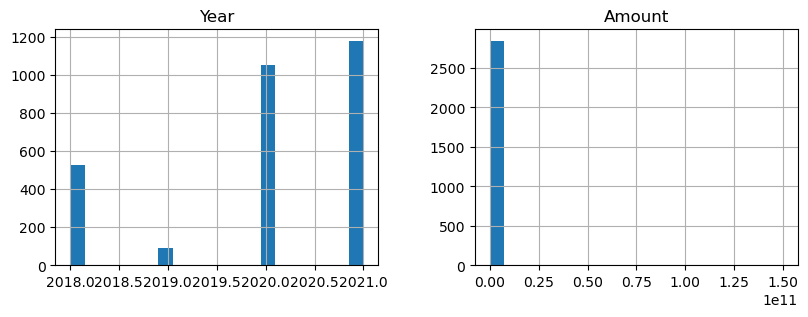

In [83]:
whole_data.hist(
    figsize=(15,15),
    layout=(4,3),
    bins=20
)
;

# Bivariate Analysis

In [84]:
pd.set_option("display.float_format", lambda x: f'{x:.2f}')

##  Question 1:  Top 10 start-ups that received the highest fund?

In [85]:
top_10_companies=whole_data.groupby("Company/Brand")["Amount"].sum().reset_index()
top_10_companies=top_10_companies.sort_values(by="Amount", ascending=False)
top_10_companies

,Company/Brand,Amount
70,Alteria Capital,150000000000.00
1554,Reliance Retail Ventures Ltd,70000000000.00
1723,Snowflake,3000000000.00
162,BYJU'S,2522000000.00
1551,Reliance,2200000000.00
1815,Swiggy,1956000000.00
1999,VerSe Innovation,1550000000.00
500,Dream Sports,1240000000.00
2150,Zomato,1239000000.00
1316,OYO,965000000.00


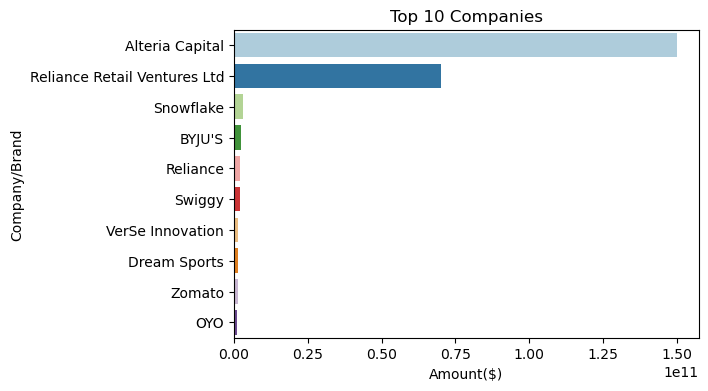

In [86]:
plt.figure(figsize=(6,4))
plt.title("Top 10 Companies")
plt.style.use("fivethirtyeight")
sns.barplot(x="Amount", y="Company/Brand", palette="Paired", data=top_10_companies.iloc[:10])
plt.ylabel("Company/Brand")
plt.xlabel("Amount($)")

plt.show()

###### The chart above shows that Alteria Capital received the highest fund with $150B followed by Reliance Retails ventures and the the 10th company on the list is OYO.

# 

## Question 2: Which 5 sectors received the most funding?

In [87]:
sector_amount = whole_data.groupby("Sector")["Amount"].sum().reset_index()
sector_amount= sector_amount.sort_values(by="Amount", ascending=False)
sector_amount

,Sector,Amount
198,Finance,157830744909.60
361,Retail,70542180000.00
165,EdTech,6227551730.00
158,E-Commerce,4179563800.00
406,Tech company,3022700000.00
39,Automobile,2469095566.00
314,Multinational conglomerate company,2200000000.00
253,Information Technology,2071111700.00
227,Health,1942871045.00
241,Hospitality,1733650000.00


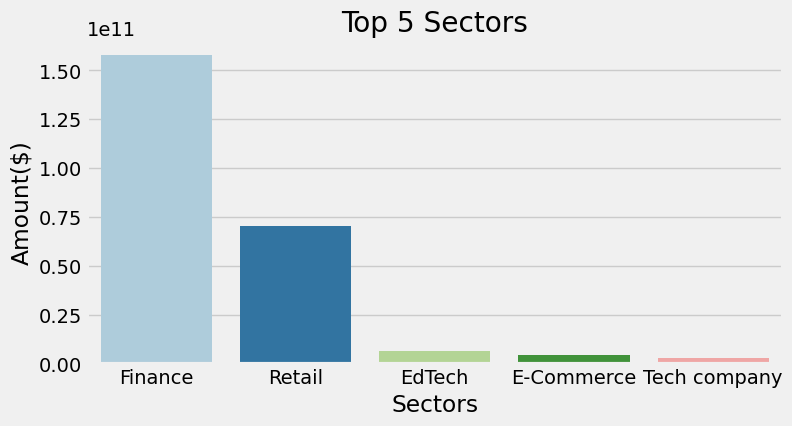

''

In [88]:
plt.figure(figsize=(8,4))
plt.title("Top 5 Sectors")
plt.style.use("fivethirtyeight")
sns.barplot(  x="Sector", y="Amount", palette="Paired", data=sector_amount.iloc[:5])

plt.ylabel("Amount($)")
plt.xlabel("Sectors")

plt.show()
;


#### The Finance sector is the highest funded sector in India, it is followed by the retail sector, EdTech, E-commerce, and Tech respectively

# 

## Question 3: Who are the major investors (Top 5) in the Indian ecosystem?

In [89]:
Major_investors = whole_data.groupby("Investor")["Amount"].sum().reset_index()
Major_investors= Major_investors.sort_values(by="Amount", ascending=False)

Major_5_investors = Major_investors.head(10)
Major_5_investors

,Investor,Amount
1591,Undisclosed,158043930411.00
1371,"Silver Lake, Mubadala Investment Company",70000000000.00
1284,"Salesforce Ventures, Dragoneer Investment Group",3000000000.00
492,"Facebook, Google, KKR, Silver Lake",2200000000.00
1523,Tiger Global,1417000000.00
353,"Canaan Valley Capital, Glade Brook Capital Par...",1000000000.00
499,"Falcon Edge, DST Global, D1 Capital, Redbird C...",840000000.00
273,"Bertelsmann India Investments, Sequoia Capital...",825000000.00
361,"Carmignac, Falcon Edge Capital",800000000.00
549,"General Atlantic, Kohlberg Kravis Roberts",800000000.00


In [90]:
Major_5_investors[1:6]

,Investor,Amount
1371,"Silver Lake, Mubadala Investment Company",70000000000.00
1284,"Salesforce Ventures, Dragoneer Investment Group",3000000000.00
492,"Facebook, Google, KKR, Silver Lake",2200000000.00
1523,Tiger Global,1417000000.00
353,"Canaan Valley Capital, Glade Brook Capital Par...",1000000000.00


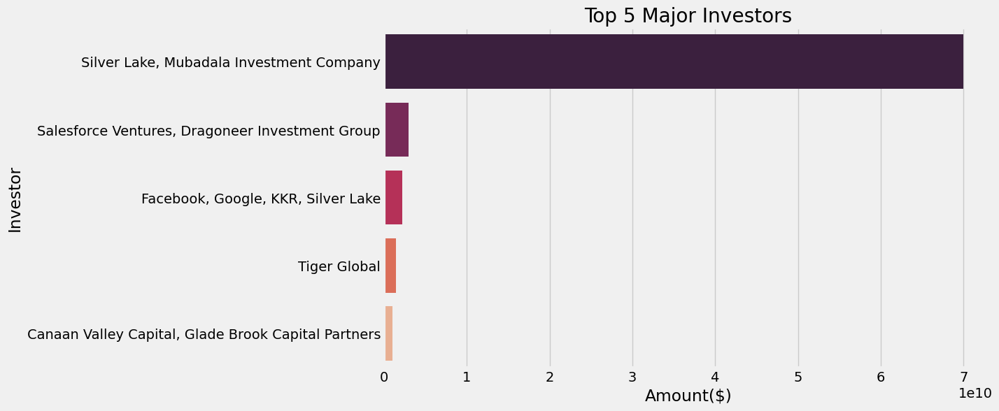

In [91]:
plt.figure(figsize=(10,6))
plt.title("Top 5 Major Investors")
plt.style.use("fivethirtyeight")
sns.barplot(x="Amount", y="Investor", palette="rocket", data= Major_5_investors[1:6])
plt.ylabel("Investor")
plt.xlabel("Amount($)")

plt.show()

###### Here, we can see that many investors are not disclosed but the Major inestors among those mentioned are:
###### 1. Silver Lake, Mubadala Investment Company
###### 2. Salesforce Ventures, Dragoneer Investment Group
###### 3. Facebook, Google, KKR, Silver Lake
###### 4. Tiger Global
###### 5. Canaan Valley Capital, Glade Brook Capital Partners

# 

## Question 4: Top 5 locations or headquarters with the highest funding

In [92]:
highest_location = whole_data.groupby("HeadQuarter")["Amount"].sum().reset_index()
highest_location=highest_location.sort_values(by="Amount", ascending=False)
highest_location

,HeadQuarter,Amount
69,Mumbai,231457272042.23
9,Bangalore,26149971824.00
38,Gurugram,6946804100.00
72,New Delhi,4217647009.60
21,California,3078300000.00
86,Pune,1391670345.00
23,Chennai,1123557746.00
40,Haryana,865393800.00
76,Noida,587037000.00
46,Jaipur,570035000.00


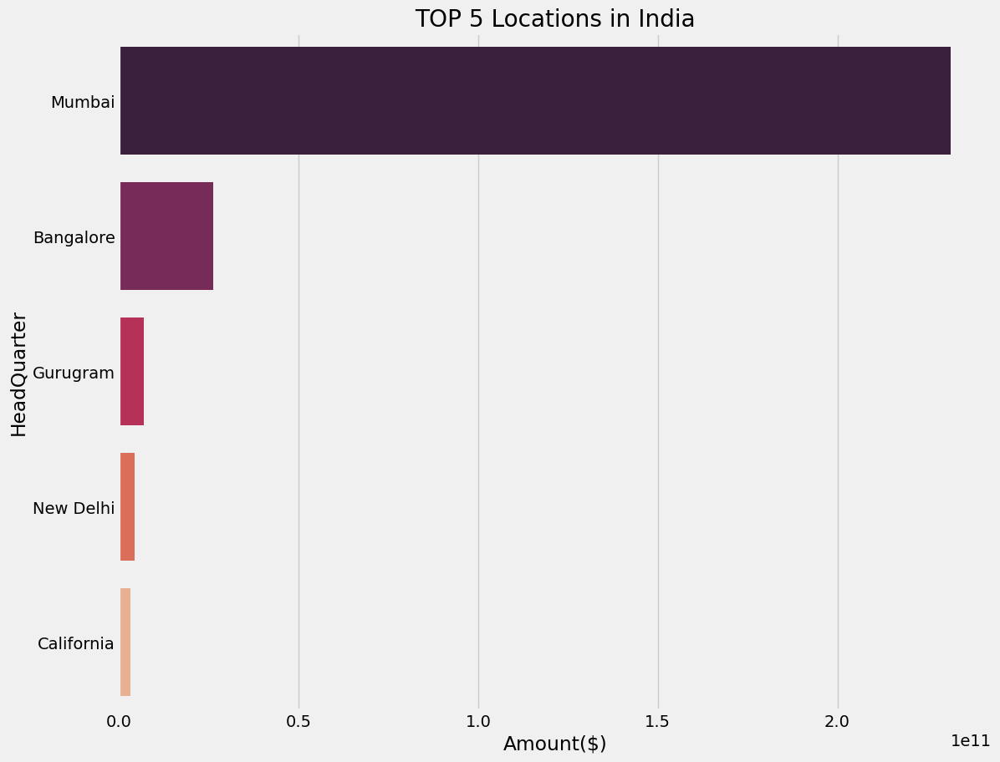

In [93]:
plt.figure(figsize=(12,10))
plt.title("TOP 5 Locations in India")
plt.style.use("fivethirtyeight")
sns.barplot(x="Amount", y="HeadQuarter", palette="rocket", data= highest_location.iloc[:5])
plt.ylabel("HeadQuarter")
plt.xlabel("Amount($)")

plt.show()

###### Mumbai has the highest sum of capital of over $231B, followed by Bangalore, Gurugram, New Delhi, and California respectively.

# 

## Question 5: What is the average fund for start-ups in India per year?

In [106]:
Avg_fund_per_year = whole_data.groupby("Year")["Amount"].mean().reset_index()

Avg_fund_per_year

,Year,Amount
0,2018,12229543.64
1,2019,37488013.48
2,2020,86583044.43
3,2021,152033937.29


''

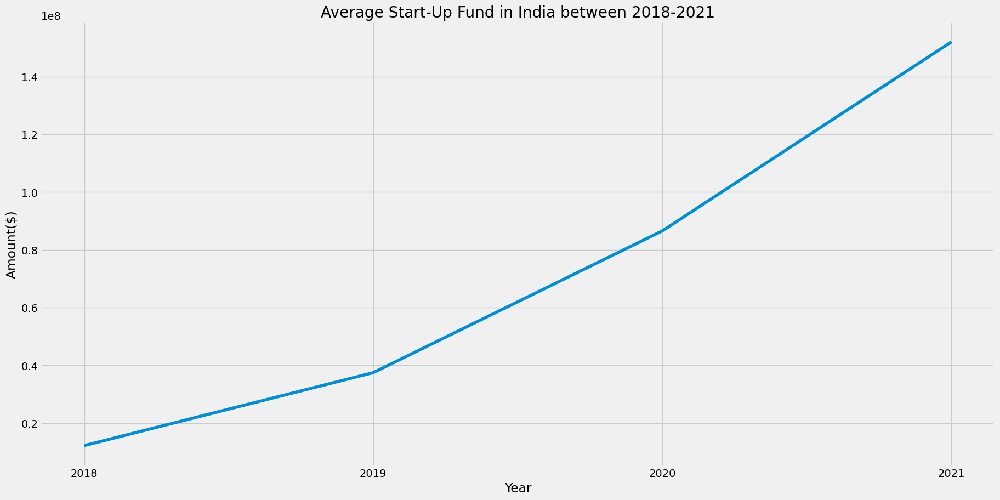

In [107]:
fig = plt.figure(figsize =(20,10))
ax = fig.add_subplot()
ax.plot(Avg_fund_per_year.Year, Avg_fund_per_year.Amount)
ax.xaxis.set_major_locator(plt.MaxNLocator(4))
ax.set_xlabel("Year")
ax.set_ylabel("Amount($)")
ax.set_title("Average Start-Up Fund in India between 2018-2021")
;

###### The average funding in the Indian ecosystem has increased between year 2018 to year 2021. 

# 

# Hypothesis

H0: The level of startup funding in India does not increase per year

H1: The level of startup funding in India increases per year

## Hypothesis Test

In [109]:
Avg_fund_per_year = whole_data.groupby("Year")["Amount"].mean().reset_index()

Avg_fund_per_year

,Year,Amount
0,2018,12229543.64
1,2019,37488013.48
2,2020,86583044.43
3,2021,152033937.29


###### From the analysis above, we can see that there has been an increase in the amount of funds yearly and this means we reject the null hypothesis.

In [110]:
whole_data.to_csv('first_project.csv', index=False)